In [8]:
import sys
#!{sys.executable} -m pip install seaborn

In [9]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import cross_validate

In [10]:
SEED=42

# Setup

## Load data

In [ ]:
file_path = './diamonds.csv'
df = pd.read_csv(file_path, index_col=0)
df_raw = pd.read_csv(file_path, index_col=0)

In [ ]:
print(df.columns)
print(df.info())

Index(['carat', 'cut', 'color', 'clarity', 'depth', 'table', 'price', 'x', 'y',
       'z'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
Int64Index: 53940 entries, 1 to 53940
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    53940 non-null  float64
 1   cut      53940 non-null  object 
 2   color    53940 non-null  object 
 3   clarity  53940 non-null  object 
 4   depth    53940 non-null  float64
 5   table    53940 non-null  float64
 6   price    53940 non-null  int64  
 7   x        53940 non-null  float64
 8   y        53940 non-null  float64
 9   z        53940 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 4.5+ MB
None


In [ ]:
numerical_col = [col for col in df.columns if df[col].dtype == 'float64' or df[col].dtype == 'int64']
cate_col = [col for col in df.columns if col not in numerical_col]
print(f'numerical_col: {numerical_col}')
print(f'cate_col: {cate_col}')

numerical_col: ['carat', 'depth', 'table', 'price', 'x', 'y', 'z']
cate_col: ['cut', 'color', 'clarity']


In [ ]:
for col in df.columns:
    if col in cate_col:
        print(col, df[col].unique())

cut ['Ideal' 'Premium' 'Good' 'Very Good' 'Fair']
color ['E' 'I' 'J' 'H' 'F' 'G' 'D']
clarity ['SI2' 'SI1' 'VS1' 'VS2' 'VVS2' 'VVS1' 'I1' 'IF']


## Preprocessing

### Diamond Clarity
The GIA grades diamond clarity on the following scale:
- IF – Internally Flawless
- VVS1 – Very Very Small Inclusions 1
- VVS2 – Very Very Small Inclusions 2
- VS1 – Very Small Inclusions 1
- VS2 – Very Small Inclusions 2
- SI1 – Small Inclusions 1
- SI2 – Small Inclusions 2
- I1 – Inclusions 1
- I2 – Inclusions 2

Source: https://www.diamonds.pro/education/vs1-clarity-guide/

### Diamond Color
D -> E -> F -> G -> H -> I -> J -> K -> L -> M

Source: https://www.diamonds.pro/education/color/

In [ ]:
mapping = {'IF': 20, 'VVS1': 18, 'VVS2': 16, 'VS1': 14, 'VS2': 12, 'SI1': 10, 'SI2': 8, 'I1': 6, 'I2': 4}
df.clarity = df.clarity.replace(mapping)

In [ ]:
mapping = {'Ideal': 5, 'Premium': 4, 'Good': 3, 'Very Good': 2, 'Fair': 1}
df.cut = df.cut.replace(mapping)

In [ ]:
mapping = {'D': 7, 'E': 6, 'F': 5, 'G': 4, 'H': 3, 'I': 3, 'J': 3}
df.color = df.color.replace(mapping)
# color_one_hot = pd.get_dummies(df.color, prefix='color')
# df = pd.concat([df.drop('color', axis=1), color_one_hot], axis=1)

In [ ]:
print(f'After preprocessing, the df now looks like:\n{df.head()}')

After preprocessing, the df now looks like:
   carat  cut  color  clarity  depth  table  price     x     y     z
1   0.23    5      6        8   61.5   55.0    330  3.95  3.98  2.43
2   0.21    4      6       10   59.8   61.0    327  3.89  3.84  2.31
3   0.23    3      6       14   56.9   65.0    328  4.05  4.07  2.31
4   0.29    4      3       12   62.4   58.0    337  4.20  4.23  2.63
5   0.31    3      3        8   63.3   58.0    338  4.34  4.35  2.75


# Question 1

## Question 1.1

In [ ]:
# Calculate the Pearson correlation matrix
corr_matrix = df.corr()

In [ ]:
corr_matrix

,carat,cut,color,clarity,depth,table,price,x,y,z
carat,1.000000,-0.114426,-0.261773,-0.352841,0.028224,0.181618,0.921591,0.975094,0.951722,0.953387
cut,-0.114426,1.000000,0.008229,0.152860,-0.169916,-0.381988,-0.049423,-0.105361,-0.105319,-0.126726
color,-0.261773,0.008229,1.000000,-0.047244,-0.045344,-0.016443,-0.162499,-0.244211,-0.238090,-0.242120
clarity,-0.352841,0.152860,-0.047244,1.000000,-0.067384,-0.160327,-0.146802,-0.371999,-0.358420,-0.366952
depth,0.028224,-0.169916,-0.045344,-0.067384,1.000000,-0.295779,-0.010648,-0.025289,-0.029341,0.094924
table,0.181618,-0.381988,-0.016443,-0.160327,-0.295779,1.000000,0.127134,0.195344,0.183760,0.150929
price,0.921591,-0.049423,-0.162499,-0.146802,-0.010648,0.127134,1.000000,0.884436,0.865422,0.861250
x,0.975094,-0.105361,-0.244211,-0.371999,-0.025289,0.195344,0.884436,1.000000,0.974701,0.970772
y,0.951722,-0.105319,-0.238090,-0.358420,-0.029341,0.183760,0.865422,0.974701,1.000000,0.952006
z,0.953387,-0.126726,-0.242120,-0.366952,0.094924,0.150929,0.861250,0.970772,0.952006,1.000000


<Axes: >

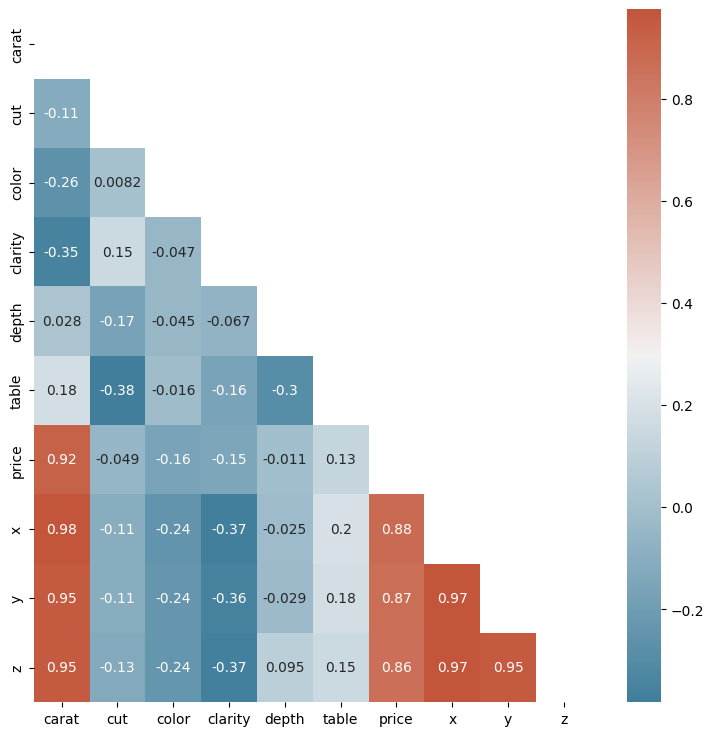

In [ ]:
f, ax = plt.subplots(figsize=(9, 9))
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr_matrix, annot=True, mask = mask, cmap=cmap)

From the figure above, we can see that the following column pairs have high correlation (cells with red):
1. price, caret
2. x, caret
3. y, caret
4. z, caret
5. price, x
6. price, y
7. price, z
8. x, y
9. x, z
10. y, z

## Question 1.2

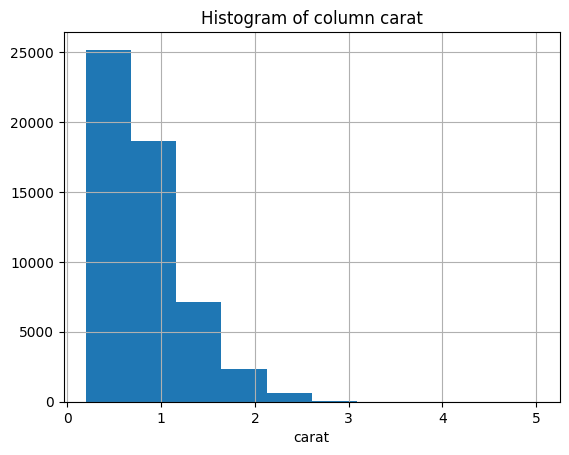

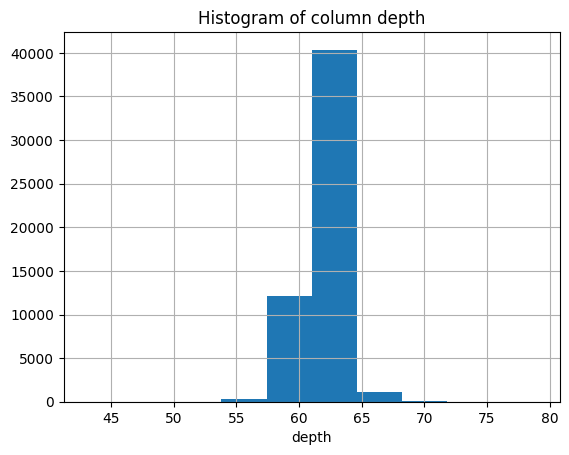

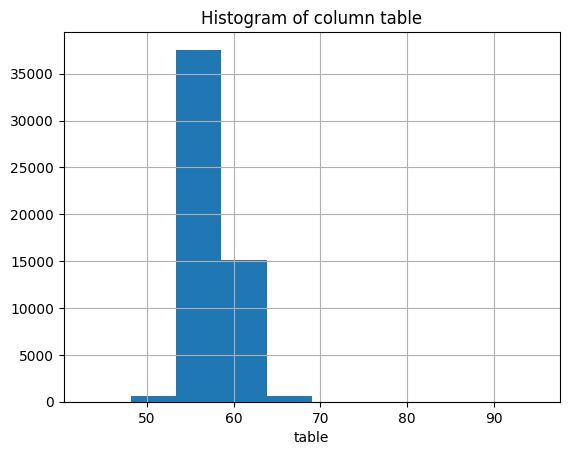

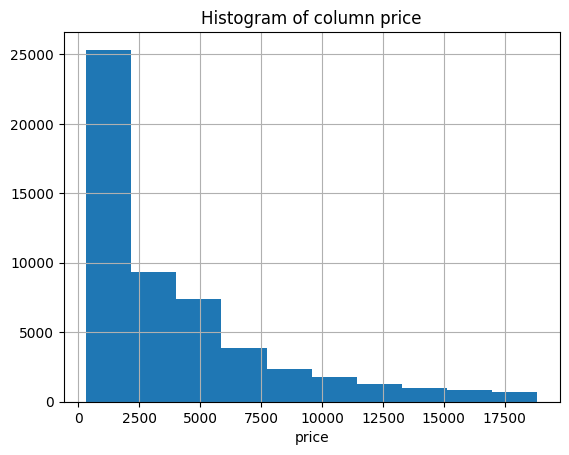

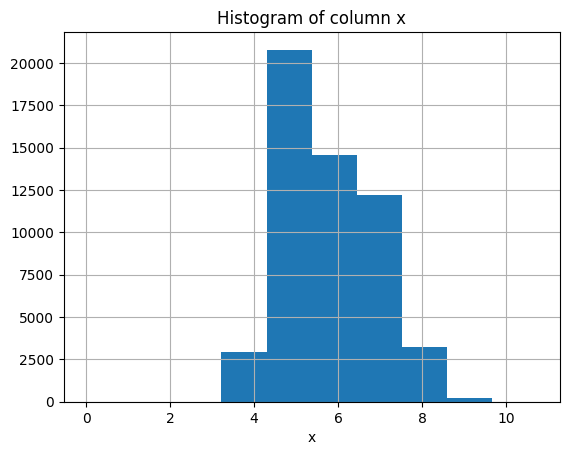

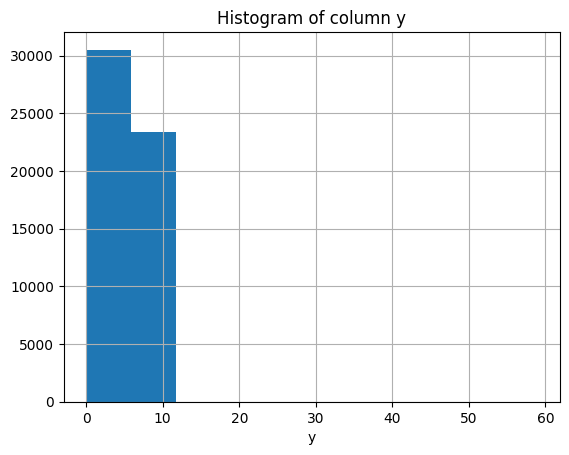

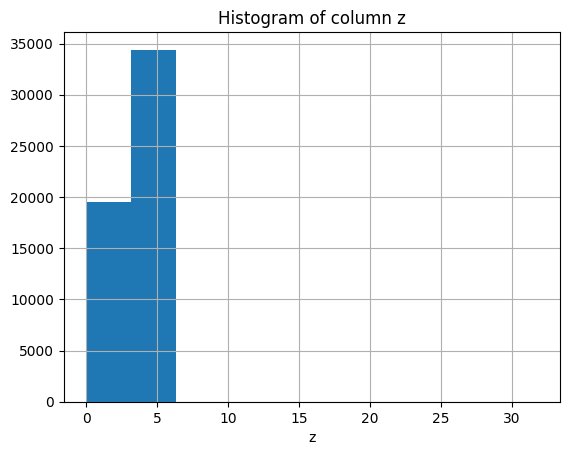

In [ ]:
for col in numerical_col:
    df[col].hist()
    # Set labels and title
    plt.xlabel(f'{col}')
    plt.title(f'Histogram of column {col}')
    # Show the plot
    plt.show()

When a column with numerical data has high skewness, there are several preprocessing steps we can perform to address this issue:

1. Logarithmic Transformation: Applying a logarithmic transformation, such as the natural logarithm (np.log1p()), can help reduce the skewness of the data. This transformation is effective for data with positive skewness.

2. Square Root Transformation: Taking the square root (np.sqrt()) of the values can also help reduce skewness, especially for data with positive skewness.

3. Box-Cox Transformation: The Box-Cox transformation is a more general approach that can handle both positive and negative skewness. It applies a power transformation to the data, aiming to make it more normally distributed. You can use the scipy.stats.boxcox() function to perform this transformation.

## Question 1.3

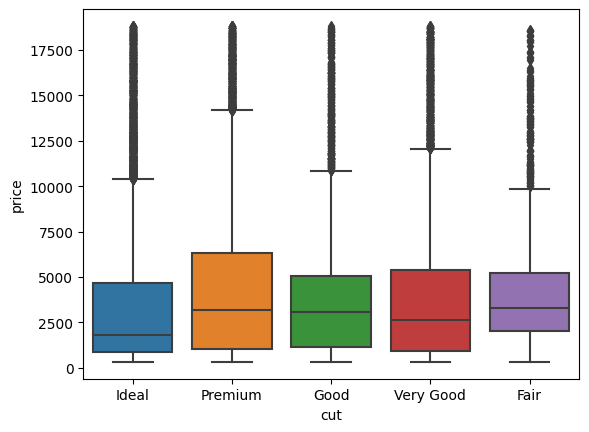

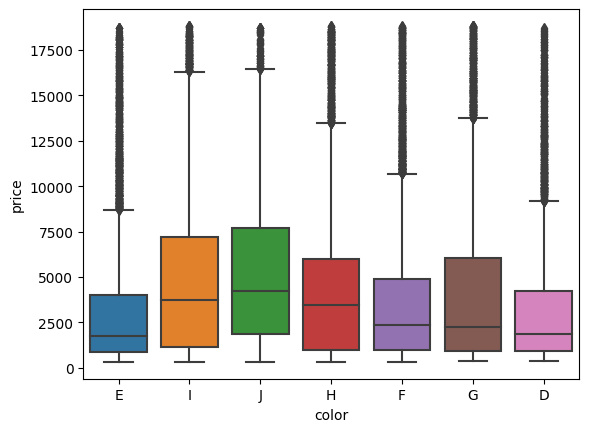

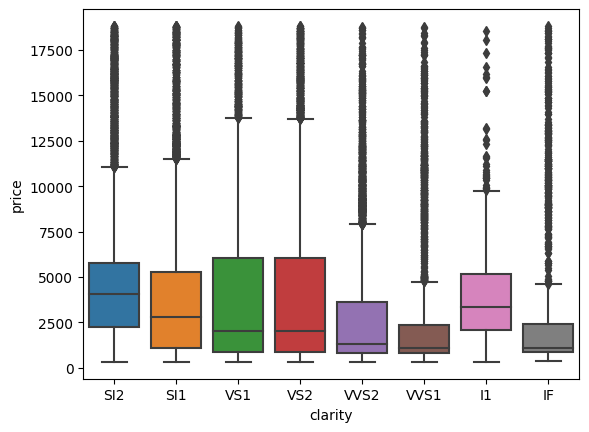

In [ ]:
target = 'price'
for col in cate_col:
    sns.boxplot(x=col, y=target, data=df_raw)
    plt.xlabel(f'{col}')
    plt.show()

There is no significant differences between price and each categorical values

## Question 1.4

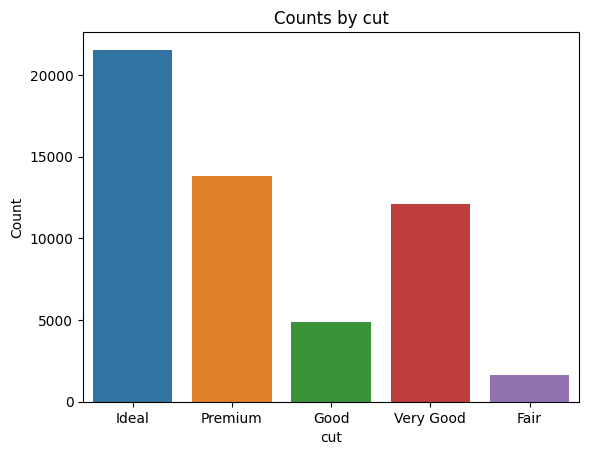

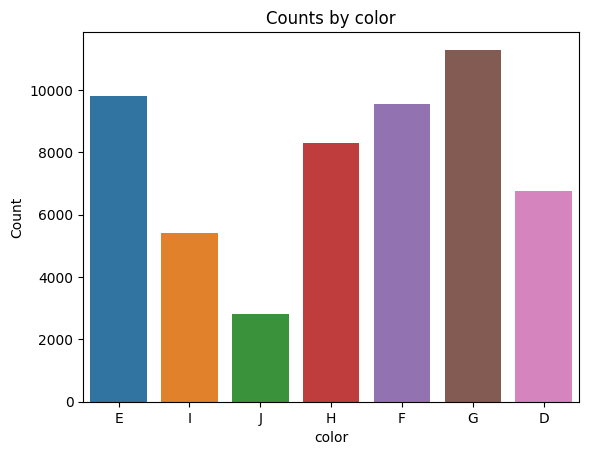

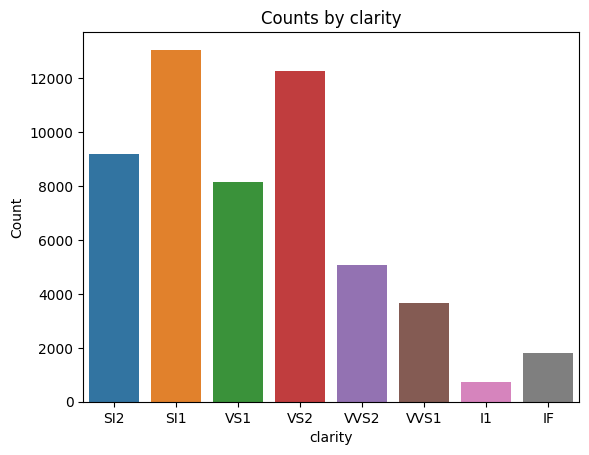

In [ ]:
for col in cate_col:
    sns.countplot(data=df_raw, x=col)
    plt.xlabel(f'{col}')
    plt.ylabel('Count')
    plt.title(f'Counts by {col}')
    plt.show()

# Question 2

## Question 2.1

In [ ]:
from sklearn.preprocessing import StandardScaler

df_no_stand = df.copy(deep=True)

scaler = StandardScaler()
for col in numerical_col:
    df[col] = scaler.fit_transform(df[[col]])

In [ ]:
df[[*numerical_col]]

,carat,depth,table,price,x,y,z
1,-1.198168,-0.174092,-1.099672,-0.903594,-1.587837,-1.536196,-1.571129
2,-1.240361,-1.360738,1.585529,-0.904346,-1.641325,-1.658774,-1.741175
3,-1.198168,-3.385019,3.375663,-0.904095,-1.498691,-1.457395,-1.741175
4,-1.071587,0.454133,0.242928,-0.901839,-1.364971,-1.317305,-1.287720
5,-1.029394,1.082358,0.242928,-0.901588,-1.240167,-1.212238,-1.117674
...,...,...,...,...,...,...,...
53936,-0.164427,-0.662711,-0.204605,-0.294982,0.016798,0.022304,-0.054888
53937,-0.164427,0.942753,-1.099672,-0.294731,-0.036690,0.013548,0.100988
53938,-0.206621,0.733344,1.137995,-0.294480,-0.063434,-0.047741,0.030135
53939,0.130927,-0.523105,0.242928,-0.295232,0.373383,0.337506,0.285204


## Question 2.2

In [ ]:
from sklearn.feature_selection import mutual_info_regression, f_regression

target = pd.Series(df.price, name='price')
df = df.drop('price', axis = 1)

# Calculate mutual information scores between each feature and the target
mi_scores = mutual_info_regression(df, target)
# Calculate F-scores for each feature with respect to the target
f_scores, _ = f_regression(df, target)

feature_scores = pd.DataFrame({'Feature': df.columns, 'MI Score': mi_scores, 'F Score': f_scores})
feature_scores = feature_scores.sort_values('MI Score', ascending=False)

In [ ]:
print(feature_scores)

   Feature  MI Score        F Score
0    carat  1.651805  304051.486618
7        y  1.421336  160915.662263
6        x  1.412383  193741.523066
8        z  1.361460  154923.266553
3  clarity  0.216557    1188.007065
2    color  0.119743    1462.906712
1      cut  0.057226     132.075106
4    depth  0.031449       6.115863
5    table  0.031355     886.119363


From the results, we can see that the column `table` and `depth` have the **least MI scores** w.r.t. target (price.)

In [11]:
from sklearn.feature_selection import SelectKBest, mutual_info_regression, f_regression
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor

In [ ]:
k = 5
X_train, X_test, y_train, y_test = train_test_split(df, target, test_size=0.2, random_state=SEED)

X_train_no_stand, X_test_no_stand, y_train_no_stand, y_test_no_stand = train_test_split(df_no_stand, target, test_size=0.2, random_state=SEED)

In [ ]:
# Selectors
selector_mi = SelectKBest(score_func=mutual_info_regression, k=k)
selector_f = SelectKBest(score_func=f_regression, k=k)

X_train_mi = selector_mi.fit_transform(X_train, y_train)
X_test_mi = selector_mi.transform(X_test)
X_train_f = selector_f.fit_transform(X_train, y_train)
X_test_f = selector_f.transform(X_test)

model_mi = LinearRegression().fit(X_train_mi, y_train)
model_f = LinearRegression().fit(X_train_f, y_train)

y_pred_mi = model_mi.predict(X_test_mi)
y_pred_f = model_f.predict(X_test_f)

rmse_mi = mean_squared_error(y_test, y_pred_mi, squared=False)
rmse_f = mean_squared_error(y_test, y_pred_f, squared=False)

In [ ]:
print(f"Test RMSE (Mutual Information): {rmse_mi:.4f}")
print(f"Test RMSE (F-scores): {rmse_f:.4f}")

Test RMSE (Mutual Information): 0.3358
Test RMSE (F-scores): 0.3725


# Question 3

In [ ]:
for score_func in [mutual_info_regression, f_regression]:
    selector_mi = SelectKBest(score_func=score_func, k=k)
    X = selector_mi.fit_transform(df, target)

    model = LinearRegression()
    cv = KFold(n_splits=10, shuffle=True, random_state=SEED) # 10-fold cv
    rmse_train_scores = -cross_val_score(model, X, target, cv=cv, scoring='neg_root_mean_squared_error')
    rmse_val_scores = -cross_val_score(model, X, target, cv=cv, scoring='neg_root_mean_squared_error')

    # Calculate the average RMSE scores
    avg_rmse_train = rmse_train_scores.mean()
    avg_rmse_val = rmse_val_scores.mean()

    print(f'Score function is {score_func.__name__}')
    print(f'Average RMSE (Training): {avg_rmse_train:.4f}')
    print(f'Average RMSE (Validation): {avg_rmse_val:.4f}')
    print()

Score function is mutual_info_regression
Average RMSE (Training): 0.3367
Average RMSE (Validation): 0.3367

Score function is f_regression
Average RMSE (Training): 0.3747
Average RMSE (Validation): 0.3747



In [ ]:
print('Performing random forest model')
for score_func in [mutual_info_regression, f_regression]:
    selector_mi = SelectKBest(score_func=score_func, k=k)
    X = selector_mi.fit_transform(df, target)

    model = RandomForestRegressor(n_estimators=100, oob_score=True, n_jobs=-1, random_state=SEED)
    model.fit(X, target)
    oob_error = 1 - model.oob_score_ # Out-of-bag error

    print(f'Score function is {score_func.__name__}')
    print(f'Out-of-Bag (OOB) Error: {oob_error:.4f}')
    print()

Performing random forest model
Score function is mutual_info_regression
Out-of-Bag (OOB) Error: 0.0647

Score function is f_regression
Out-of-Bag (OOB) Error: 0.1004



# Question 4
### Linear Regression

In [ ]:
from sklearn.linear_model import LinearRegression, Lasso, Ridge

In [ ]:
ols_model = LinearRegression()
lasso_model = Lasso()
ridge_model = Ridge()

cv = KFold(n_splits=10, shuffle=True, random_state=SEED) # 10-fold cv
rmse_ols = -cross_val_score(ols_model, X_train, y_train, cv=cv, scoring='neg_root_mean_squared_error')
rmse_lasso = -cross_val_score(lasso_model, X_train, y_train, cv=cv, scoring='neg_root_mean_squared_error')
rmse_ridge = -cross_val_score(ridge_model, X_train, y_train, cv=cv, scoring='neg_root_mean_squared_error')

print(f"RMSE (OLS): {rmse_ols.mean():.4f}")
print(f"RMSE (Lasso): {rmse_lasso.mean():.4f}")
print(f"RMSE (Ridge): {rmse_ridge.mean():.4f}")

RMSE (OLS): 0.4545
RMSE (Lasso): 0.3481
RMSE (Ridge): 0.4430


In [ ]:
penalties = [0.0001, 0.008, 0.01, 0.03, 0.05, 0.1, 0.3, 0.5, 1.0, 5.0, 10.0]
min_rmse_ols, min_rmse_lasso, min_rmse_ridge = 1e8, 1e8, 1e8
best_ols_penalty, best_lasso_penalty, best_ridge_penalty = 0, 0, 0

for penalty in penalties:
    print(f"Penalty: {penalty}")
    
    ols_model = LinearRegression()
    lasso_model = Lasso(alpha=penalty)
    ridge_model = Ridge(alpha=penalty)

    cv = KFold(n_splits=10, shuffle=True, random_state=SEED)
    rmse_ols = -cross_val_score(ols_model, X_train, y_train, cv=cv, scoring='neg_root_mean_squared_error').mean()
    rmse_lasso = -cross_val_score(lasso_model, X_train, y_train, cv=cv, scoring='neg_root_mean_squared_error').mean()
    rmse_ridge = -cross_val_score(ridge_model, X_train, y_train, cv=cv, scoring='neg_root_mean_squared_error').mean()
    
    if min_rmse_ols > rmse_ols:
        min_rmse_ols = rmse_ols
        best_ols_penalty = penalty
    if min_rmse_lasso > rmse_lasso:
        min_rmse_lasso = rmse_lasso
        best_lasso_penalty = penalty
    if min_rmse_ridge > rmse_ridge:
        min_rmse_ridge = rmse_ridge
        best_ridge_penalty = penalty

    print(f"RMSE (OLS, Lasso, Ridge): {rmse_ols:.4f}, {rmse_lasso:.4f}, {rmse_ridge:.4f}")

Penalty: 0.0001
RMSE (OLS, Lasso, Ridge): 0.4545, 0.3513, 0.4545
Penalty: 0.008
RMSE (OLS, Lasso, Ridge): 0.4545, 0.2458, 0.4544
Penalty: 0.01
RMSE (OLS, Lasso, Ridge): 0.4545, 0.2414, 0.4543
Penalty: 0.03
RMSE (OLS, Lasso, Ridge): 0.4545, 0.2447, 0.4540
Penalty: 0.05
RMSE (OLS, Lasso, Ridge): 0.4545, 0.2467, 0.4537
Penalty: 0.1
RMSE (OLS, Lasso, Ridge): 0.4545, 0.2575, 0.4530
Penalty: 0.3
RMSE (OLS, Lasso, Ridge): 0.4545, 0.3193, 0.4504
Penalty: 0.5
RMSE (OLS, Lasso, Ridge): 0.4545, 0.3309, 0.4480
Penalty: 1.0
RMSE (OLS, Lasso, Ridge): 0.4545, 0.3481, 0.4430
Penalty: 5.0
RMSE (OLS, Lasso, Ridge): 0.4545, 0.5908, 0.4183
Penalty: 10.0
RMSE (OLS, Lasso, Ridge): 0.4545, 0.9451, 0.3998


## Question 4.1

Regularization schemes, such as Lasso and Ridge regression, affect the learned parameter set by introducing a penalty term to the loss function during the training process. This penalty term helps prevent overfitting and controls the complexity of the model. Here's an explanation of how each regularization scheme affects the learned parameter set:

1. Ordinary Least Squares (OLS) Regression:
OLS regression is the basic linear regression without any regularization. It aims to minimize the sum of squared residuals between the predicted and actual target values. The learned parameter set in OLS regression is directly determined by this objective, without any additional penalty or constraint.

2. Lasso Regression:
Lasso regression introduces an L1 regularization penalty to the loss function. The L1 penalty is the sum of the absolute values of the regression coefficients multiplied by a regularization parameter (alpha). It encourages sparsity in the learned parameter set by pushing some coefficients to exactly zero. As a result, Lasso tends to perform feature selection by automatically excluding less relevant features from the model. The higher the alpha value, the more coefficients will be reduced to zero.

3. Ridge Regression:
Ridge regression introduces an L2 regularization penalty to the loss function. The L2 penalty is the sum of the squared values of the regression coefficients multiplied by a regularization parameter (alpha). It promotes small values for all coefficients, effectively shrinking them towards zero without forcing them to become exactly zero. Ridge regression is particularly useful when dealing with multicollinearity (high correlation) among the features because it helps to reduce the impact of correlated features. The alpha parameter controls the degree of regularization, with larger values resulting in more regularization.

## Question 4.2

In [ ]:
print(f'[lasso] Penalty that cause min RMSE: {best_lasso_penalty}')
print(f'[ridge] Penalty that cause min RMSE: {best_ridge_penalty}')

[lasso] Penalty that cause min RMSE: 0.01
[ridge] Penalty that cause min RMSE: 10.0


From the code above, we tried different penalties. For OLS it does not matter since OLS does not take penalty into account. For LASSO, we get the best performance when penalty is the smallest value, 0.0001. As for Ridge, it always get the same result.

## Question 4.3

In [ ]:
penalties = [0.0001, 0.008, 0.01, 0.03, 0.05, 0.1, 0.3, 0.5, 1.0, 5.0, 10.0]
min_rmse_ols_no_stand, min_rmse_lasso_no_stand, min_rmse_ridge_no_stand = 1e8, 1e8, 1e8
best_ols_penalty_no_stand, best_lasso_penalty_no_stand, best_ridge_penalty_no_stand = 0, 0, 0

for penalty in penalties:
    print(f"Penalty: {penalty}")
    
    ols_model_no_stand = LinearRegression()
    lasso_model_no_stand = Lasso(alpha=penalty)
    ridge_model_no_stand = Ridge(alpha=penalty)

    cv = KFold(n_splits=10, shuffle=True, random_state=SEED)
    rmse_ols_no_stand = -cross_val_score(ols_model_no_stand, X_train_no_stand, y_train_no_stand, cv=cv, scoring='neg_root_mean_squared_error').mean()
    rmse_lasso_no_stand = -cross_val_score(lasso_model_no_stand, X_train_no_stand, y_train_no_stand, cv=cv, scoring='neg_root_mean_squared_error').mean()
    rmse_ridge_no_stand = -cross_val_score(ridge_model_no_stand, X_train_no_stand, y_train_no_stand, cv=cv, scoring='neg_root_mean_squared_error').mean()
    
    if min_rmse_ols_no_stand > rmse_ols_no_stand:
        min_rmse_ols_no_stand = rmse_ols_no_stand
        best_ols_penalty_no_stand = penalty
    if min_rmse_lasso_no_stand > rmse_lasso_no_stand:
        min_rmse_lasso_no_stand = rmse_lasso_no_stand
        best_lasso_penalty_no_stand = penalty
    if min_rmse_ridge_no_stand > rmse_ridge_no_stand:
        min_rmse_ridge_no_stand = rmse_ridge_no_stand
        best_ridge_penalty_no_stand = penalty

    print(f"RMSE (OLS, Lasso, Ridge): {rmse_ols_no_stand:.4f}, {rmse_lasso_no_stand:.4f}, {rmse_ridge_no_stand:.4f}")

Penalty: 0.0001
RMSE (OLS, Lasso, Ridge): 0.0000, 0.0000, 0.0000
Penalty: 0.008
RMSE (OLS, Lasso, Ridge): 0.0000, 0.0000, 0.0000
Penalty: 0.01
RMSE (OLS, Lasso, Ridge): 0.0000, 0.0000, 0.0000
Penalty: 0.03
RMSE (OLS, Lasso, Ridge): 0.0000, 0.0000, 0.0000
Penalty: 0.05
RMSE (OLS, Lasso, Ridge): 0.0000, 0.0000, 0.0000
Penalty: 0.1
RMSE (OLS, Lasso, Ridge): 0.0000, 0.0000, 0.0000
Penalty: 0.3
RMSE (OLS, Lasso, Ridge): 0.0000, 0.0001, 0.0000
Penalty: 0.5
RMSE (OLS, Lasso, Ridge): 0.0000, 0.0001, 0.0000
Penalty: 1.0
RMSE (OLS, Lasso, Ridge): 0.0000, 0.0003, 0.0000
Penalty: 5.0
RMSE (OLS, Lasso, Ridge): 0.0000, 0.0013, 0.0000
Penalty: 10.0
RMSE (OLS, Lasso, Ridge): 0.0000, 0.0025, 0.0000


From the above result we can see that without standardization, all the RSMEs are zero, i.e., there is a direct relationship with the correlation coefficient. For example, if the correlation coefficient is 1, the RMSE will be 0, because all of the points lie on the regression line (and therefore there are no errors).

As a result, feature standardization does play a role in improving the model performance.

## Question 4.4

In linear regression, p-values are used to determine the statistical significance of the relationship between each feature (independent variable) and the target variable (dependent variable). The p-value measures the probability of obtaining the observed data if the null hypothesis is true, where the null hypothesis assumes no relationship between the feature and the target variable.

The meaning of p-values in the context of linear regression is as follows:

1. If the p-value is less than a predetermined significance level (commonly 0.05), it indicates that there is strong evidence to reject the null hypothesis. In this case, we can infer that the feature has a statistically significant relationship with the target variable.

2. If the p-value is greater than the significance level, it suggests that there is insufficient evidence to reject the null hypothesis. This means that there is no significant relationship between the feature and the target variable.

# END OF QUESTION 4
***

# Question 5
### Polynomial Regression

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge

best_degree = None
best_rmse = 0.0
for deg in range(1, 5):
    print('Training Polynomial Regression for degree =', deg)
    poly = PolynomialFeatures(degree=deg, include_bias=False)
    df_poly = poly.fit_transform(df)
    df_poly = pd.DataFrame(df_poly)

    ridge_pf = Ridge(alpha=10)
    cv = KFold(n_splits=10, shuffle=True, random_state=SEED)
    ridge_rmse_scores = -cross_val_score(ridge_pf, df_poly, target, cv=cv, scoring='neg_root_mean_squared_error')

    avg_ridge_rmse = ridge_rmse_scores.mean()
    print(f'Average RMSE: {avg_ridge_rmse:.4f}')
    print('='*30)
    
    if best_degree is None or ridge_pf_avg_rmse < best_rmse:
        best_degree = deg
        best_rmse = ridge_pf_avg_rmse

poly = PolynomialFeatures(degree=best_degree, include_bias=False)
df_poly = poly.fit_transform(df)
X_train_poly, X_test_poly, y_train_poly, y_test_poly = train_test_split(df_poly, target, test_size=0.2, random_state=SEED)

ridge_pf = Ridge(alpha=10)
ridge_pf = ridge_pf.fit(X_train_poly, y_train_poly)
y_pred_poly = ridge_pf.predict(X_test_poly)
rmse_poly = mean_squared_error(y_test_poly, y_pred_poly, squared=False)

print(f"Best model at degree = {best_degree}")
print(f"Re-train RMSE = {rmse_poly}")

df_ridge_pf_best_result = pd.DataFrame({'Feature': poly.feature_names_in_, 'Coef': ridge_pf.coef_[0:9]}, columns=['Feature', 'Coef'])
display(df_ridge_pf_best_result)

Training Polynomial Regression for degree = 1
Average RMSE: 0.3126
Training Polynomial Regression for degree = 2
Average RMSE: 0.4758
Training Polynomial Regression for degree = 3
Average RMSE: 2.7491
Training Polynomial Regression for degree = 4
Average RMSE: 306.1178
Best model at degree = 1
Re-train RMSE = 0.3144321222943914


,Feature,Coef
0,carat,1.254658
1,cut,0.018395
2,color,0.084607
3,clarity,0.063142
4,depth,-0.034986
5,table,-0.023369
6,x,-0.227581
7,y,0.006590
8,z,-0.003926


In [ ]:
# Without CV
from sklearn.preprocessing import PolynomialFeatures

poly_reg_model = []
poly_reg_model_best = None
for deg in range(1, 7):
    result = {}
    result['Degree'] = deg
    print('Training Polynomial Regression for degree =', deg)
    poly = PolynomialFeatures(degree=deg, include_bias=False)
    df_poly = poly.fit_transform(df)
    result['Powers'] = poly.powers_
    result['Feature_Names'] = poly.feature_names_in_
    X_train_poly, X_test_poly, y_train_poly, y_test_poly = train_test_split(df_poly, target, test_size=0.2, random_state=SEED)

    result['Model'] = Ridge()
    result['Model'].fit(X_train_poly, y_train_poly)
    y_pred_poly = result['Model'].predict(X_test_poly)

    rmse_poly = mean_squared_error(y_test_poly, y_pred_poly, squared=False)
    result['RMSE'] = rmse_poly
    if poly_reg_model_best is None or poly_reg_model_best['RMSE'] > rmse_poly:
        poly_reg_model_best = result
    
    # Checking the model performance on test set
    y_pred_poly_train = result['Model'].predict(X_train_poly)
    rmse_poly = mean_squared_error(y_train_poly, y_pred_poly_train, squared=False)
    result['RMSE_Train'] = rmse_poly

    poly_reg_model.append(result)

Training Polynomial Regression for degree = 1
Training Polynomial Regression for degree = 2
Training Polynomial Regression for degree = 3
Training Polynomial Regression for degree = 4
Training Polynomial Regression for degree = 5
Training Polynomial Regression for degree = 6


In [ ]:
# Without CV
for result in poly_reg_model:
    print(f"RMSE (Polynomial Regression) (degree = {result['Degree']}): {result['RMSE']:.4f}")
    print(f"RMSE (Polynomial Regression) (degree = {result['Degree']} on TRAINING SET): {result['RMSE_Train']:.4f}")
print(f"Best model at degree = {poly_reg_model_best['Degree']}")
df_poly_reg_model_best_result = pd.DataFrame({'Feature': poly_reg_model_best['Feature_Names'], 'Coef': poly_reg_model_best['Model'].coef_[0:9]}, columns=['Feature', 'Coef'])
display(df_poly_reg_model_best_result)

RMSE (Polynomial Regression) (degree = 1): 0.3144
RMSE (Polynomial Regression) (degree = 1 on TRAINING SET): 0.3119
RMSE (Polynomial Regression) (degree = 2): 0.2186
RMSE (Polynomial Regression) (degree = 2 on TRAINING SET): 0.2138
RMSE (Polynomial Regression) (degree = 3): 0.2041
RMSE (Polynomial Regression) (degree = 3 on TRAINING SET): 0.1725
RMSE (Polynomial Regression) (degree = 4): 1.1019
RMSE (Polynomial Regression) (degree = 4 on TRAINING SET): 0.1610
RMSE (Polynomial Regression) (degree = 5): 12.0881
RMSE (Polynomial Regression) (degree = 5 on TRAINING SET): 0.1524
RMSE (Polynomial Regression) (degree = 6): 13.0880
RMSE (Polynomial Regression) (degree = 6 on TRAINING SET): 0.1434
Best model at degree = 3


,Feature,Coef
0,carat,-0.941872
1,cut,0.244378
2,color,0.330707
3,clarity,0.266368
4,depth,-0.044060
5,table,0.007453
6,x,0.348231
7,y,0.561487
8,z,0.481120


## Question 5.1
#### What are the most salient features? Why?
```
carat is the most salient features as the absolute value of coefficient of it is highest alone
```

## Question 5.2
#### What degree of polynomial is best? How did you find the optimal degree? What does a very high-order polynomial imply about the fit on the training data? What about its performance on testing data?
```
Best Degree = 1, by looping from 1 to 4 and compare the RMSE.

The polynomial model can fit the training data very much that over-fitting issue may happen. However, the RMSE of the models on the training set would be much lower compare to the RMSE on the testing set, which is over-fitting.
```

# END OF QUESTION 5
***

In [ ]:
X = df.drop('price', axis=1)
y = df['price']

# Question 6
### Neural Network

In [ ]:
from sklearn.neural_network import MLPRegressor
import sklearn

for hl1 in [3, 5, 8, 10]:
    for hl2 in [3, 5, 8, 10]:
        print(f'Training NN with hidden layer = ({hl1}, {hl2})')
        nn = MLPRegressor(hidden_layer_sizes=(hl1, hl2), solver='lbfgs', alpha=1e-4, activation='relu', max_iter=10000, random_state=SEED)
        cv = KFold(n_splits=10, shuffle=True, random_state=SEED)
        nn_rmse_scores = -cross_val_score(nn, df, target, cv=cv, scoring='neg_root_mean_squared_error')

        avg_nn_rmse = nn_rmse_scores.mean()
        print(f'Average RMSE: {avg_nn_rmse:.4f}')
        print('='*30)

Training NN with hidden layer = (3, 3)
Average RMSE: 0.2490
Training NN with hidden layer = (3, 5)
Average RMSE: 0.2561
Training NN with hidden layer = (3, 8)
Average RMSE: 0.2140
Training NN with hidden layer = (3, 10)
Average RMSE: 0.4346
Training NN with hidden layer = (5, 3)
Average RMSE: 0.2536
Training NN with hidden layer = (5, 5)
Average RMSE: 0.2570
Training NN with hidden layer = (5, 8)
Average RMSE: 0.2204
Training NN with hidden layer = (5, 10)
Average RMSE: 0.2109
Training NN with hidden layer = (8, 3)
Average RMSE: 0.9999
Training NN with hidden layer = (8, 5)
Average RMSE: 0.2188
Training NN with hidden layer = (8, 8)
Average RMSE: 0.2076
Training NN with hidden layer = (8, 10)
Average RMSE: 0.1883
Training NN with hidden layer = (10, 3)
Average RMSE: 0.2443
Training NN with hidden layer = (10, 5)
Average RMSE: 0.1800
Training NN with hidden layer = (10, 8)
Average RMSE: 0.2421
Training NN with hidden layer = (10, 10)
Average RMSE: 0.2106


## Question 6.2
#### How does the performance generally compare with linear regression? Why?
```
NN is generally better as NN can handle nonlinear model while linear regression cannot
```

## Question 6.3
#### What activation function did you use for the output and why? You may use none.
```
ReLu as the output of ReLua is non-negative and our target variable is non-negative number
```

## Question 6.4
#### What is the risk of increasing the depth of the network too far?
```
There might be risk of overfitting
```

# END OF QUESTION 6
***

# Question 7
### Random Forest

## Question 7.1
#### Explain how these hyper-parameters affect the overall performance. Describe if and how each hyper-parameter results in a regularization effect during training
```
Maximum number of features:
Smaller number of features can produce more random trees with higher uncorrelated prediction errors.
As more random trees could be produced, overfitting issues would be avoided.

Number of trees:
More trees contribute to better generalization performance.
As more trees are included, hence the fitting time is slower which more difficult to incur overfitting issue.

Depth of each tree:
Deeper trees might consider more features in each tree which contribute to better performance.
Deeper trees might incur overfitting but given the random forest nature, the issue is elinated.
```

## Question 7.2
#### How do random forests create a highly non-linear decision boundary despite the fact that all we do at each layer is apply a threshold on a feature?

```
Because random forest is with nest if-else structures, hence the resulting model is more like a stair shape which end up contribute to non-linear model
```

In [ ]:
from sklearn.ensemble import RandomForestRegressor

kf = KFold(n_splits=10)
forest_to_be_printed = None
forest_depth4_best_rmse = 0.0
for n_est in [100, 200, 300]:
    for depth in [3, 4, 5]:
        for max_f in ['sqrt', 'log2']:
            print(f'Training - n_estimators:{n_est} | max_depth:{depth} | max_features:{max_f}')
            rf_avg_rmse = 0.0
            rf_avg_oob_error = 0.0
            for train_index, test_index in kf.split(df):
                X_train, X_test = df.loc[df.index.isin(train_index+1)], df.loc[df.index.isin(test_index+1)]
                y_train, y_test = target.loc[df.index.isin(train_index+1)], target.loc[df.index.isin(test_index+1)]
                rf = RandomForestRegressor(n_estimators=n_est, max_depth=depth, max_features=max_f, oob_score=True, n_jobs=-1, random_state=SEED)
                rf = rf.fit(X_train, y_train)
                rf_pred = rf.predict(X_test)
                rf_avg_rmse = rf_avg_rmse + mean_squared_error(y_test, rf_pred, squared=False)
                rf_avg_oob_error = rf_avg_oob_error + 1 - rf.oob_score_
                if depth == 4 and forest_depth4_best_rmse < rmse_rf:
                    forest_to_be_printed = rf
            rf_avg_rmse = rf_avg_rmse / 10
            rf_avg_oob_error = rf_avg_oob_error / 10
            print(f'Avg. RMSE: {rf_avg_rmse:.4f}')
            print(f'Avg. Out-of-Bag (OOB) Error: {rf_avg_oob_error:.4f}')
            print('='*30)
                


Training - n_estimators:100 | max_depth:3 | max_features:sqrt
Avg. RMSE: 0.3718
Avg. Out-of-Bag (OOB) Error: 0.1080
Training - n_estimators:100 | max_depth:3 | max_features:log2
Avg. RMSE: 0.3718
Avg. Out-of-Bag (OOB) Error: 0.1080
Training - n_estimators:100 | max_depth:4 | max_features:sqrt
Avg. RMSE: 0.3259
Avg. Out-of-Bag (OOB) Error: 0.0807
Training - n_estimators:100 | max_depth:4 | max_features:log2
Avg. RMSE: 0.3259
Avg. Out-of-Bag (OOB) Error: 0.0807
Training - n_estimators:100 | max_depth:5 | max_features:sqrt
Avg. RMSE: 0.2934
Avg. Out-of-Bag (OOB) Error: 0.0614
Training - n_estimators:100 | max_depth:5 | max_features:log2
Avg. RMSE: 0.2934
Avg. Out-of-Bag (OOB) Error: 0.0614
Training - n_estimators:200 | max_depth:3 | max_features:sqrt
Avg. RMSE: 0.3730
Avg. Out-of-Bag (OOB) Error: 0.1091
Training - n_estimators:200 | max_depth:3 | max_features:log2
Avg. RMSE: 0.3730
Avg. Out-of-Bag (OOB) Error: 0.1091
Training - n_estimators:200 | max_depth:4 | max_features:sqrt
Avg. RMSE:

## Question 7.3
#### Randomly pick a tree in your random forest model (with maximum depth of 4) and plot its structure.
```
Which feature is selected for branching at the root node? y
What can you infer about the importance of this feature as opposed to others? It's with the highest importance
Do the important features correspond to what you got in part 3.3.1? No, in 3.3.1 the highest import
```

In [ ]:
import graphviz 
tree1 = forest_to_be_printed.estimators_[1]
dot_data = tree.export_graphviz(tree1, out_file=None, feature_names=df.columns, 
                                class_names="price", filled=True, rounded=True, special_characters=True)
graph = graphviz.Source(dot_data)
graph.render('random_forest', view=False)

df_linear_regression_coef = pd.DataFrame({'feature name': ols_model.feature_names_in_, 'ols': ols_model.coef_,
                                         'lasso': lasso_model.coef_, 'ridge': ridge_model.coef_})
display(df_linear_regression_coef)

,feature name,ols,lasso,ridge
0,carat,1.262097,0.0,1.261346
1,cut,0.018410,-0.0,0.018409
2,color,0.084714,-0.0,0.084703
3,clarity,0.063106,-0.0,0.063109
4,depth,-0.035512,-0.0,-0.035458
5,table,-0.023418,0.0,-0.023413
6,x,-0.236242,0.0,-0.235363
7,y,0.007129,0.0,0.007072
8,z,-0.003078,0.0,-0.003166


## Question 7.4
#### Measure “Out-of-Bag Error” (OOB). Explain what OOB error and R2 score means.
```
OOB error refers to the wrongly predicted OOB samples
R2 Score refers to the proportion of variance from which the target can be predicted from the features
```

# END OF QUESTION 7
***

# Question 8
### LightGBM, CatBoost and Bayesian Optimization

## Question 8.1
#### Read the documentation of LightGBM OR CatBoost and determine the important hyperparameters along with a search space for the tuning of these parameters (keep the search space small).

In [ ]:
import lightgbm as lgb

for n_est in [100, 200, 300]:
    for depth in [3, 4, 5]:
        print(f'Training - n_estimators:{n_est} | max_depth:{depth}')
        model_lgb = lgb.LGBMRegressor(objective = "regression", n_jobs = -1, n_estimators=n_est, max_depth=depth, random_state=SEED)
        cv = KFold(n_splits=10, shuffle=True, random_state=SEED)
        nn_rmse_scores = -cross_val_score(model_lgb, df, target, cv=cv, scoring='neg_root_mean_squared_error')

        avg_nn_rmse = nn_rmse_scores.mean()
        print(f'Average RMSE: {avg_nn_rmse:.4f}')
        print('='*30)

Training - n_estimators:100 | max_depth:3
Average RMSE: 0.1727
Training - n_estimators:100 | max_depth:4
Average RMSE: 0.1604
Training - n_estimators:100 | max_depth:5
Average RMSE: 0.1569
Training - n_estimators:200 | max_depth:3
Average RMSE: 0.1666
Training - n_estimators:200 | max_depth:4
Average RMSE: 0.1582
Training - n_estimators:200 | max_depth:5
Average RMSE: 0.1558
Training - n_estimators:300 | max_depth:3
Average RMSE: 0.1634
Training - n_estimators:300 | max_depth:4
Average RMSE: 0.1570
Training - n_estimators:300 | max_depth:5
Average RMSE: 0.1556


## Question 8.2
#### Apply Bayesian optimization using skopt.BayesSearchCV from scikit-optmize to find the ideal hyperparameter combination in your search space. Keep your search space small enough to finish running on a single Google Colab instance within 60 minutes. Report the best hyperparameter set found and the corresponding RMSE.

In [ ]:
from skopt import BayesSearchCV
import datetime

np.int = np.int64 # Fixing issue in skopt: `np.int` is a deprecated alias for the builtin `int`
import warnings
warnings.simplefilter("ignore", UserWarning)

model_lgb = lgb.LGBMRegressor(objective = "regression", n_jobs = -1, random_state=SEED)
cv = KFold(n_splits=10, shuffle=True, random_state=SEED)
opt = BayesSearchCV(
    model_lgb,
    {
        'n_estimators': [150, 300],
        'max_depth': [3, 8]
    },
    n_iter=150,
    cv=cv,
    scoring='neg_root_mean_squared_error',
    verbose=False
)

print('Start:', datetime.datetime.now())
opt.fit(df, target)
print('End:', datetime.datetime.now())

Start: 2023-06-10 00:10:45.434252
End: 2023-06-10 00:29:14.267125


In [ ]:
print(f"Best Params: {opt.best_params_}")
print(f"Best Score: {-opt.best_score_:.4f}")
print(f"Test Score: {-opt.score(X_test, y_test):.4f}")

Best Params: OrderedDict([('max_depth', 6), ('n_estimators', 276)])
Best Score: 0.1550
Test Score: 0.1341


## Question 8.3
#### Qualitatively interpret the effect of the hyperparameters using the Bayesian optimization results:
```
Which of them helps with performance? n_estimators seems to be contribute more on performance than max_depth
Which helps with regularization (shrinks the generalization gap)? n_estimators contribute to better generalization performance.
Which affects the fitting efficiency? n_estimators because it determines how many trees are built in the forest
```

# END OF QUESTION 8
***

# Question 9

In [12]:


import json
import datetime

!{sys.executable} -m pip install msgspec


from msgspec.json import decode
from msgspec import Struct

import pickle

import time

from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer, TfidfVectorizer
from sklearn.neural_network import MLPRegressor
import gc

!{sys.executable} -m pip install transformers
!{sys.executable} -m pip install torch torchvision torchaudio

from google.colab import drive
drive.mount('/content/drive')
!ls
%cd 'drive/MyDrive/ece219-p4'
!ls

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.3/183.3 kB 7.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 50.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 25.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 49.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 76.9 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Mounted at /content/drive
drive  sample_data
/content/drive/MyDrive/ece219-p4
dfPickle     gohawks_pickle	hw4.ipynb   patriots_pickle  superbowl_pickle
df_sentence  gopatriots_pickle	nfl_pickle  sb49_pickle      tweets


In [13]:
hashtags = ['gohawks','gopatriots','nfl','patriots','sb49','superbowl']

In [ ]:

tweets_list = []
for i in range(0,len(hashtags)):
    print('Adding #'+hashtags[i]+' tweets.')
    file_path_ = './tweets/tweets_#'+hashtags[i]+'.txt'
    file = open(file_path_, 'r',encoding='utf-8')
    tweets_list.append(file.readlines())
    file.close()


Adding #gohawks tweets.
Adding #gopatriots tweets.
Adding #nfl tweets.
Adding #patriots tweets.
Adding #sb49 tweets.
Adding #superbowl tweets.


## Question 9.1
#### Report the following statistics for each hashtag, i.e. each file has: Question 9.1
#### • Average number of tweets per hour
#### • Average number of followers of users posting the tweets per tweet (to make it simple, we average over the number of tweets; if a users posted twice, we count the user and the user’s followers twice as well)
#### • Average number of retweets per tweet

In [ ]:
for i,k in enumerate(tweets_list):
    num_tweets = len(k)
    num_retweets = 0
    num_followers = 0
    time_list =[]
    for j in k:
        j_obj = json.loads(j)
        num_retweets += j_obj['metrics']['citations']['total']
        num_followers += j_obj['author']['followers']
        time_list.append(j_obj['citation_date'])
    
    print('Hashtag: '+ hashtags[i])
    max_time = datetime.datetime.fromtimestamp(max(time_list))
    min_time = datetime.datetime.fromtimestamp(min(time_list))
    print('Avg Tweets/hr: '+str(num_tweets/((max_time-min_time).total_seconds()/3600)))
    print('Avg Followers: ' + str(num_followers/num_tweets))
    print('Avg Retweets: ' + str(num_retweets/num_tweets))
    print('='*30)


Hashtag: gohawks
Avg Tweets/hr: 292.48785062173687
Avg Followers: 2217.9237355281984
Avg Retweets: 2.0132093991319877
Hashtag: gopatriots
Avg Tweets/hr: 40.95469800606194
Avg Followers: 1427.2526051635405
Avg Retweets: 1.4081919101697078
Hashtag: nfl
Avg Tweets/hr: 397.0213901819841
Avg Followers: 4662.37544523693
Avg Retweets: 1.5344602655543254
Hashtag: patriots
Avg Tweets/hr: 750.89426460689
Avg Followers: 3280.4635616550277
Avg Retweets: 1.7852871288476946
Hashtag: sb49
Avg Tweets/hr: 1276.8570598680474
Avg Followers: 10374.160292019487
Avg Retweets: 2.52713444111402
Hashtag: superbowl
Avg Tweets/hr: 2072.11840170408
Avg Followers: 8814.96799424623
Avg Retweets: 2.3911895819207736


##Question 9.2

In [ ]:
neutralTw = [*tweets_list[2],*tweets_list[5]]
print(len(neutralTw))

1446835


In [ ]:
hours = []
for k in neutralTw:
    curr_tweet = json.loads(k)
    curr_time = datetime.datetime.fromtimestamp(curr_tweet['citation_date'])
    hours.append(curr_time.hour)

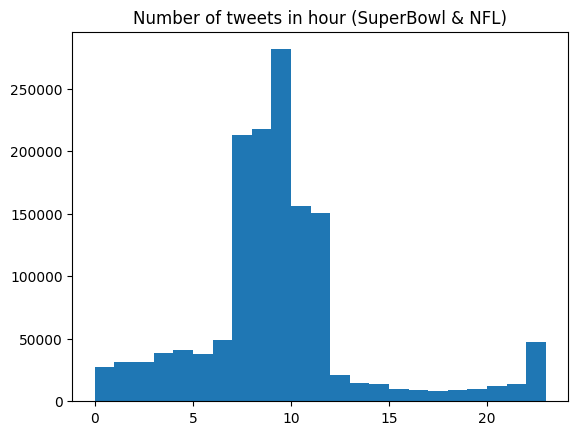

In [ ]:
plt.title('Number of tweets in hour (SuperBowl & NFL)')
plt.hist(hours, bins = range(0,24))
plt.show()

#  Question 10
For our design project, we decided to perform a library of prediction/classification tasks for each tweet. Specifically, we decided to predict the number of retweets of a specific tweet, as well as classify the tweet as being written by a fan of one of the two teams (The Hawks or the Patriots). 

# Data Subsampling
For our task, we decided that given our technical limitations, a subset of the very large dataset should be used. Specificially, 5000 tweets were sampled from the #gohawks and #gopatriots datasets, giving a total dataset of 10,000 tweets. The reasoning for selecting tweets from these datasets was due to the fact that they both contained a similar average amount of retweets, which would increase the accuracy of our retweet prediction, as well as the datasets they were sampled from could be used as labels indicating the team to which they are loyal. (A tweet from the #gohawks database could be assumed to guaranteed come from a Hawks fan, and not from a Patriots fan.) Additionally, the original dataset was significantly skewed towards the hawks, so by taking an equal number of tweets from each fanbase, we reduce the chance of our model picking up this bias.

# Feature Selection
In order to assign accurate retweet values/fan classifications based on the text of a tweet, the text must be converted to a feature vector which (hopefully) captures the semantic context of the tweet. In previous projects, approaches such as TF-IDF and GloVe were used for this. In this project, we used BERT. BERT (Bidirectional Encoder Representation from Transformers) is a deep learning model that is popular for Masked Language Modeling and Next Sentence Prediction. For our purposes, we utilized a pretrained BERT network to perform transfer learning; that is, a tweet was inputted to the BERT network, the output of the second-to-last layer of the BERT network was taken giving a 64 token/768 feature tensor for each sentence. The value of these features was averaged over the tokens of the sentence, resulting in a 768 element feature vector per sentence. Note that BERT can be very memory expensive; 10k sentences at 64 tokens apiece, with a batch size of 16, resulted in a VRAM usage of approx 26gb.

# Model and Baseline
Two models were chosen to use the expert features given by the pretrained BERT network; a __Regression model__ in order to predict the amount of retweets a given tweet would have, and a __Binary_Classification__ model to predict the fanbase which a given tweet belongs to. As a baseline, TF-IDF representations of the given tweets were also used with these networks, with the error compared to our BERT derivative models. 

# Function setup

In [ ]:
#Data structure for more efficient JSON parsing using msgspec
class Tweet(Struct):
    text: str
        
class Citations(Struct):
    total: int

class Metrics(Struct):
    citations: Citations

class Author(Struct):
    followers: float

class tweet_item(Struct):
    tweet: Tweet
    metrics: Metrics
    author: Author
    citation_date: int


In [ ]:
#Function to display progress bar (quality of life)
def progress_bar(current, total, bar_length=20):
    fraction = current / total

    arrow = int(fraction * bar_length - 1) * '-' + '>'
    padding = int(bar_length - len(arrow)) * ' '

    ending = '\n' if current == total else '\r'

    print(f'Progress: [{arrow}{padding}] {int(fraction*100)}%', end=ending)

In [ ]:
#Function to clean dirty text
import re
def clean(text):
#     text = re.sub(r'^([^\s:]+):.*\n', '', text, flags=re.MULTILINE)
    text = re.sub(r'^https?:\/\/.*[\r\n]*', '', text, flags=re.MULTILINE)
    text = re.sub(r'http\S+', '', text, flags=re.MULTILINE)
    texter = re.sub(r'\b[0-9]+\b\s*', '', text) # Exclude purely numbers terms
    texter = re.sub(r"<br />", " ", texter)
    texter = re.sub(r"&quot;", "\"",texter)
    texter = re.sub('&#39;', "\"", texter)
    texter = re.sub('\n', " ", texter)
    texter = re.sub('\t', " ", texter)
    texter = re.sub(' u '," you ", texter)
    texter = re.sub('`',"", texter)
    texter = re.sub(' +', ' ', texter)
    texter = re.sub('\-*', '', texter)
#     texter = re.sub('\|*', '', texter)
#     texter = re.sub('\>*', '', texter)
#     texter = re.sub('\**', '', texter)
    texter = re.sub(r"(!)\1+", r"!", texter)
    texter = re.sub(r"(\?)\1+", r"?", texter)
    texter = re.sub('&amp;', 'and', texter)
    texter = re.sub('\r', ' ',texter)
    texter = re.sub('  ', ' ',texter)
    clean = re.compile('<.*?>')
    texter = texter.encode('ascii', 'ignore').decode('ascii')
    texter = re.sub(clean, '', texter)
    if texter == "":
        texter = ""
    return texter

In [ ]:
#Function to import raw JSON tweets to a dataframe of desired quantities
def tweetsToDf(tweets,verbose = False):
    num_tweets = len(tweets)
    df_raw = []
    for i,k in enumerate(tweets):
        j_obj = decode(k, type=tweet_item)
        tweet_text = clean(j_obj.tweet.text)
        num_retweets = j_obj.metrics.citations.total
        num_followers = j_obj.author.followers
        time_posted = j_obj.citation_date
        df_raw.append([tweet_text,time_posted,num_retweets,num_followers,0])
        if verbose: progress_bar(i,num_tweets)
    return pd.DataFrame(df_raw, columns = ['text','time','retweets','followers','label'])

In [25]:
def format_time(elapsed):
    '''
    Takes a time in seconds and returns a string hh:mm:ss
    '''
    # Round to the nearest second.
    elapsed_rounded = int(round((elapsed)))
    
    # Format as hh:mm:ss
    return str(datetime.timedelta(seconds=elapsed_rounded))


In [30]:
def check_RMSE(model, X, y):

    cv = KFold(n_splits=10, shuffle=True, random_state=SEED) # 10-fold cv
    rmse_train_scores = -cross_val_score(model, X, y, cv=cv, scoring='neg_root_mean_squared_error')
    rmse_val_scores = -cross_val_score(model, X, y, cv=cv, scoring='neg_root_mean_squared_error')

    # Calculate the average RMSE scores
    avg_rmse_train = rmse_train_scores.mean()
    avg_rmse_val = rmse_val_scores.mean()

    print(f'Average RMSE (Training): {avg_rmse_train:.4f}')
    print(f'Average RMSE (Validation): {avg_rmse_val:.4f}')
    print()

# Expert Feature Extraction w/ BERT

In [ ]:
#Pickle list of cleaned tweets
df_list =[]
for i in tweets_list:
    df_list.append(tweetsToDf(i,verbose=True))
df_pickle = open('dfPickle', 'ab')
pickle.dump(df_list, df_pickle)                     
df_pickle.close()

Progress: [---->               ] 26%

Progress: [------>             ] 35%

NameError: name 'dfn_list' is not defined

In [14]:
#Unpickle list of cleaned tweets
df_list =[]
for i,k in enumerate(hashtags):
    pickle_path = k +'_pickle'
    df_pickle = open(pickle_path, 'rb')
    df_list.append(pickle.load(df_pickle))             
    df_pickle.close()

In [18]:
#Tweet selection
from sklearn.utils import resample
#Select 5k tweets each from hawks and patriots, form dataset.
num_tweets_in = 5000

df_text_hawks = df_list[0]['text'].values.tolist()
y_retweets_hawks = df_list[0]['retweets'].tolist()
df_text_patriots = df_list[1]['text'].values.tolist()
y_retweets_patriots = df_list[1]['retweets'].tolist()

df_text_hawks_s,y_retweets_hawks_s = resample(df_text_hawks,y_retweets_hawks,replace = False,n_samples=num_tweets_in,random_state=SEED)
df_text_patriots_s,y_retweets_patriots_s = resample(df_text_patriots,y_retweets_patriots,replace = False,n_samples=num_tweets_in,random_state=SEED)


#group into input set, corresponding retweets, corresponding fan labels (0 for hawks fans, 1 for patriots fans)
df_text = df_text_hawks_s + df_text_patriots_s
y_retweets = y_retweets_hawks_s + y_retweets_patriots_s
y_labels = [0]*num_tweets_in + [1]*num_tweets_in

In [20]:
#Clear GPU RAM (To be used in case of crash, etc.)
torch.cuda.empty_cache()
out_final =None
gc.collect()


NameError: ignored

In [21]:
#BERT Feature Extraction

import torch
#Use cuda device, clear vram
device = torch.device("cuda")
torch.cuda.empty_cache()
out_final =None
gc.collect()

from transformers import BertTokenizer, BertModel
#Using Basic pretrained BERT tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

input_ids = []
attention_masks = []

#Encode tweets to input IDs and attention masks
for tweet in df_text:
    encoded_dict = tokenizer.encode_plus(tweet,
                                     add_special_tokens = True,
                                     max_length = 64,
                                     pad_to_max_length = True,
                                     return_attention_mask = True,
                                     return_tensors='pt')
    input_ids.append(encoded_dict['input_ids'])
    attention_masks.append(encoded_dict['attention_mask'])

input_ids = torch.cat(input_ids, dim=0)
attention_masks = torch.cat(attention_masks, dim=0)
labels = torch.tensor(y_retweets)


Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:2377: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


In [23]:
from torch.utils.data import DataLoader, RandomSampler, SequentialSampler
from torch.utils.data import TensorDataset, random_split
#Create dataloader to improve performance

dataset = TensorDataset(input_ids, attention_masks, labels)

batch_size = 16

dataloader = DataLoader(
            dataset,  
            sampler = RandomSampler(dataset), 
            batch_size = batch_size 
        )



In [24]:
#Load BERT model
model = BertModel.from_pretrained('bert-base-uncased',
                                  output_hidden_states = True,
                                  )
#Load model in cuda, and in eval mode (we won't be training it.)
model.cuda()
model.eval()

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


BertModel(
  (embeddings): BertEmbeddings(
    (word_embeddings): Embedding(30522, 768, padding_idx=0)
    (position_embeddings): Embedding(512, 768)
    (token_type_embeddings): Embedding(2, 768)
    (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): BertEncoder(
    (layer): ModuleList(
      (0-11): 12 x BertLayer(
        (attention): BertAttention(
          (self): BertSelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): BertSelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
            (dropout): Dropout(p=0.1, inplace=False)
  

In [26]:
#Iterates through batches from dataloader, evaluates them on BERT model, and saves values necessary for features
out_final = []
t0 = time.time()
with torch.no_grad():
    for step,batch in enumerate(dataloader):
        if step % 25 == 0 and not step == 0:
            
            elapsed = format_time(time.time() - t0)
            
            
            print('  Batch {:>5,}  of  {:>5,}.    Elapsed: {:}.'.format(step, len(dataloader), elapsed))
       
        b_input_ids = batch[0].to(device)
        b_input_mask = batch[1].to(device)
        b_labels = batch[2].to(device)
        #output[0:1] are ignored, as they're related to loss for training. output[2] contains hidden layer info, which we will convert to expert features
        output = model(b_input_ids, 
                             token_type_ids=None, 
                             attention_mask=b_input_mask, 
                             )
        #Grab all hidden states, save as tensor with size (13(layers)x16(batch size/sentences per batch)x64(tokens per sentence)x768(features per token))
        token_embeddings = torch.stack(output[2], dim=0)
        #Grab second to last layer values for batch, toss the rest
        token_vecs = token_embeddings[-2]

        out_final.append(token_vecs)
    


  Batch     5  of    625.    Elapsed: 0:00:01.
  Batch    10  of    625.    Elapsed: 0:00:01.
  Batch    15  of    625.    Elapsed: 0:00:01.
  Batch    20  of    625.    Elapsed: 0:00:01.
  Batch    25  of    625.    Elapsed: 0:00:01.
  Batch    30  of    625.    Elapsed: 0:00:01.
  Batch    35  of    625.    Elapsed: 0:00:01.
  Batch    40  of    625.    Elapsed: 0:00:01.
  Batch    45  of    625.    Elapsed: 0:00:01.
  Batch    50  of    625.    Elapsed: 0:00:01.
  Batch    55  of    625.    Elapsed: 0:00:01.
  Batch    60  of    625.    Elapsed: 0:00:01.
  Batch    65  of    625.    Elapsed: 0:00:01.
  Batch    70  of    625.    Elapsed: 0:00:02.
  Batch    75  of    625.    Elapsed: 0:00:02.
  Batch    80  of    625.    Elapsed: 0:00:02.
  Batch    85  of    625.    Elapsed: 0:00:02.
  Batch    90  of    625.    Elapsed: 0:00:02.
  Batch    95  of    625.    Elapsed: 0:00:02.
  Batch   100  of    625.    Elapsed: 0:00:02.
  Batch   105  of    625.    Elapsed: 0:00:02.
  Batch   110

In [ ]:
#Need to parse output into sentence embedding
#Reference: https://mccormickml.com/2019/05/14/BERT-word-embeddings-tutorial/
#This will be our expert feature for analysis 

In [27]:
#Convert BERT output into usable feature vectors
X_sentence =[]
#For each batch in output list
for ts in out_final:
  #Make list of tensors for each sentence
  sentence_flat = torch.unbind(ts)
  #for each sentence
  for st in sentence_flat:
    #average over the tokens and append
    X_sentence.append(torch.mean(st, dim=0).cpu().numpy())
X_sentence = np.array(X_sentence)

(10000, 768)


In [28]:
#Pickle tweet sentence vectors
sentence_pickle = open('df_sentence', 'ab')
pickle.dump(X_sentence, sentence_pickle)                     
sentence_pickle.close()

In [29]:
#Unpickle tweet sentence vectors
sentence_pickle = open('df_sentence', 'rb')
X_sentence = pickle.load(sentence_pickle)             
sentence_pickle.close()
print(X_sentence.shape)

(10000, 768)


# TF-IDF Baseline

In [19]:
#Baseline Tf-Idf 
vectorizer = TfidfVectorizer(
    min_df=5,
    stop_words='english',
)
X_tfidf = vectorizer.fit_transform(df_text)

# Regression for Retweet Prediction

In [31]:
#Retweets regression

model = MLPRegressor(hidden_layer_sizes=(10,2), solver='lbfgs', alpha=1e-4, activation='relu', max_iter=10000, random_state=42)
check_RMSE(model,X_sentence,y_retweets)

KeyboardInterrupt: ignored

# Classification for Tweet Fandom

In [32]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import wordnet
from nltk.stem import PorterStemmer, WordNetLemmatizer
from sklearn.base import TransformerMixin, BaseEstimator
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import NMF, TruncatedSVD
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import (LinearSVC, SVC)
from sklearn import preprocessing, metrics
from sklearn.metrics import (accuracy_score,
                             auc,
                             confusion_matrix,
                             ConfusionMatrixDisplay,
                             f1_score,
                             precision_score,
                             RocCurveDisplay,
                             recall_score,
                             roc_curve,
)
from sklearn.decomposition import NMF, TruncatedSVD
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.utils.extmath import randomized_svd

In [33]:
# Function to print the model performance of binary classifcation
def evaluate(y_test, y_pred, average='binary', clf=None):
    cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
    cm_display = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_)
    cm_display.plot()
    plt.show()

    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)
    roc_auc = metrics.auc(fpr, tpr)
    roc_display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc,)
    roc_display.plot()
    
    plt.show()
    
    print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
    print(f"F-1 score: {f1_score(y_test, y_pred, average='binary')}")
    print(f"Recall: {recall_score(y_test, y_pred, average='binary')}")
    print(f"Precision: {precision_score(y_test, y_pred, average='binary')}")
    print('='*100, '\r\n')

In [ ]:
#Fan classification (0 for Hawks, 1 for Patriots)
svm_hard = LinearSVC(C=1000, random_state=SEED)
y_pred_hard = svm_hard.fit(X_train_LSI, train['root_label_cat']).predict(X_test_LSI)